In [17]:
import itertools
import numpy as np
import pandas as pd 
from numbers import Number
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [98]:
df = pd.read_csv('data/kc_house_data.csv')

In [99]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'greenbelt', 'nuisance', 'view',
       'condition', 'grade', 'heat_source', 'sewer_system', 'sqft_above',
       'sqft_basement', 'sqft_garage', 'sqft_patio', 'yr_built',
       'yr_renovated', 'address', 'lat', 'long'],
      dtype='object')

In [174]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,...,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,...,PUBLIC,1180,0,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,...,PUBLIC,1570,1570,0,240,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,...,PUBLIC,1580,1580,0,0,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,...,PUBLIC,1090,1070,200,270,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,...,PUBLIC,1120,550,550,30,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30150,7834800180,11/30/2021,1555000.0,5,2.0,1910,4000,1.5,NO,NO,...,PUBLIC,1600,1130,0,210,1921,0,"4673 Eastern Avenue North, Seattle, Washington...",47.664740,-122.32940
30151,194000695,6/16/2021,1313000.0,3,2.0,2020,5800,2.0,NO,NO,...,PUBLIC,2020,0,0,520,2011,0,"4131 44th Avenue Southwest, Seattle, Washingto...",47.565610,-122.38851
30152,7960100080,5/27/2022,800000.0,3,2.0,1620,3600,1.0,NO,NO,...,PUBLIC,940,920,240,110,1995,0,"910 Martin Luther King Jr Way, Seattle, Washin...",47.610395,-122.29585
30153,2781280080,2/24/2022,775000.0,3,2.5,2570,2889,2.0,NO,NO,...,PUBLIC,1830,740,480,100,2006,0,"17127 114th Avenue Southeast, Renton, Washingt...",47.449490,-122.18908


In [100]:
df_clean = df.dropna()

In [101]:
df.address

0        2102 Southeast 21st Court, Renton, Washington ...
1        11231 Greenwood Avenue North, Seattle, Washing...
2        8504 South 113th Street, Seattle, Washington 9...
3        4079 Letitia Avenue South, Seattle, Washington...
4        2193 Northwest Talus Drive, Issaquah, Washingt...
                               ...                        
30150    4673 Eastern Avenue North, Seattle, Washington...
30151    4131 44th Avenue Southwest, Seattle, Washingto...
30152    910 Martin Luther King Jr Way, Seattle, Washin...
30153    17127 114th Avenue Southeast, Renton, Washingt...
30154    18615 7th Avenue South, Burien, Washington 981...
Name: address, Length: 30155, dtype: object

In [147]:
df_split = df_clean.address.str.split(', ')

'R'

In [148]:
cities = []
numbers = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
for x in df_split:
    if x[1][0] in numbers:
        cities.append(x[2])     
    else:
        cities.append(x[1])
pd.Series(cities)
df_split

0        [2102 Southeast 21st Court, Renton, Washington...
1        [11231 Greenwood Avenue North, Seattle, Washin...
2        [8504 South 113th Street, Seattle, Washington ...
3        [4079 Letitia Avenue South, Seattle, Washingto...
4        [2193 Northwest Talus Drive, Issaquah, Washing...
                               ...                        
30150    [4673 Eastern Avenue North, Seattle, Washingto...
30151    [4131 44th Avenue Southwest, Seattle, Washingt...
30152    [910 Martin Luther King Jr Way, Seattle, Washi...
30153    [17127 114th Avenue Southeast, Renton, Washing...
30154    [18615 7th Avenue South, Burien, Washington 98...
Name: address, Length: 30111, dtype: object

In [149]:
df_clean['city'] = pd.Series(cities)

In [150]:
city_dummies = pd.get_dummies(df_clean.city)

In [151]:
city_dummies

,Algona,Allston,Altoona,Ames Lake,Anchorage,Aneta,Ardoch,Arlington,Asbury Park,Auburn,...,West Tisbury,Westport,White Center,Whitehall,Whittier,Williston,Woodbury,Woodinville,Yaphank,Yarrow Point
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30150,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30151,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30152,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30153,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [157]:
cities_df = pd.concat([df_clean.price,city_dummies], axis=1)

In [162]:
y = df_clean.price
X = sm.add_constant(city_dummies.drop('Algona', axis=1))
model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     2.180
Date:                Tue, 06 Dec 2022   Prob (F-statistic):           4.00e-29
Time:                        14:13:44   Log-Likelihood:            -4.5509e+05
No. Observations:               30111   AIC:                         9.108e+05
Df Residuals:                   29796   BIC:                         9.134e+05
Df Model:                         314                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    1.256e+06   9.19e+04     13.669      0.000    1.08e+06    1.44e+06
Allston                 -2.864e+05   4.09e+05     -0.700      0.484   -1.09e+06    5.15e+05
Altoona                  2.063e+05   6.37e+05      0.324      0.746   -1.04e+06    1.45e+06
Ames Lake                3.608e+05   8.96e+05      0.403      0.687   -1.39e+06    2.12e+06
Anchorage               -3.325e+04   4.09e+05     -0.081      0.935   -8.35e+05    7.68e+05
Aneta                   -2.312e+05   8.96e+05     -0.258      0.796   -1.99e+06    1.52e+06
Ardoch                  -6.306e+05   4.55e+05     -1.386      0.166   -1.52e+06    2.61e+05
Arlington                4262.2553   4.55e+05      0.009      0.993   -8.87e+05    8.96e+05
Asbury Park             -3.395e+05   3.28e+05     -1.035      0.301   -9.83e+05    3.04e+05
Auburn                   -1.56e+05   9.47e+04     -1.647      0.100   -3.42e+05    2.97e+04
Austin                  -6.173e+05   8.96e+05     -0.689      0.491   -2.37e+06    1.14e+06
Baldwin                  3.619e+04   3.49e+05      0.104      0.917   -6.48e+05     7.2e+05
Baring                  -4.997e+05   3.75e+05     -1.332      0.183   -1.24e+06    2.36e+05
Bay Shore               -3.862e+05   6.37e+05     -0.607      0.544   -1.63e+06    8.62e+05
Beach Haven             -4.485e+04   2.55e+05     -0.176      0.861   -5.45e+05    4.55e+05
Beaux Arts              -4.431e+05   2.84e+05     -1.561      0.119      -1e+06    1.13e+05
Beaver Falls            -6.532e+05   8.96e+05     -0.729      0.466   -2.41e+06     1.1e+06
Beaverton               -3.982e+05   8.96e+05     -0.445      0.657   -2.15e+06    1.36e+06
Bellevue                -1.236e+05   9.47e+04     -1.306      0.192   -3.09e+05     6.2e+04
Berger                  -5.412e+05   6.37e+05     -0.850      0.395   -1.79e+06    7.07e+05
Billings                 5.838e+05   6.37e+05      0.917      0.359   -6.64e+05    1.83e+06
Bismarck                -2.045e+05   2.84e+05     -0.720      0.471   -7.61e+05    3.52e+05
Black Diamond           -1.449e+05   1.06e+05     -1.361      0.173   -3.54e+05    6.37e+04
Boise                   -8.062e+05   8.96e+05     -0.900      0.368   -2.56e+06     9.5e+05
Bothell                 -1.395e+05   1.07e+05     -1.302      0.193   -3.49e+05    7.04e+04
Bradenton               -6.124e+04   8.96e+05     -0.068      0.945   -1.82e+06    1.69e+06
Brentwood                1.361e+05   5.23e+05      0.260      0.795   -8.88e+05    1.16e+06
Brooklyn                -4.562e+05   8.96e+05     -0.509      0.611   -2.21e+06     1.3e+06
Brooksville             -4.362e+05   8.96e+05     -0.487      0.626   -2.19e+06    1.32e+06
Burien                  -1.673e+05   9.87e+04     -1.695      0.090   -3.61e+05    2.61e+04
Butler                  -6.562e+05   8.96e+05  

In [173]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import contextily as cx

%matplotlib inline

In [190]:
df_clean['loc'] = df_clean[['long','lat']].values.tolist()

In [191]:
geometry = [Point(tuple(xy)) for xy in df_clean['loc']]
geo_df = gpd.GeoDataFrame(df_clean, crs="EPSG:4326", geometry=geometry)

In [192]:
df_wm = geo_df.to_crs(epsg=3857)

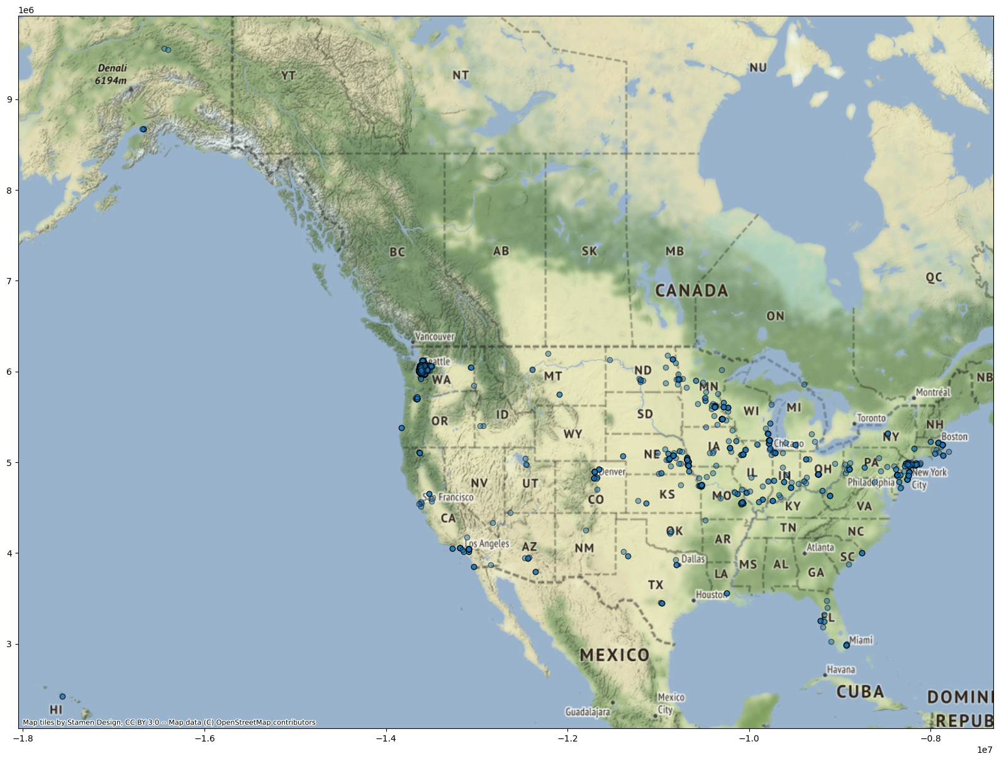

In [193]:
ax = df_wm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
cx.add_basemap(ax)

In [243]:
wash = []

for x in df.address:
    if 'Washington' in x:
        wash.append('True')
    else:
        wash.append('False')
df_clean['washington'] = pd.Series(wash)
df_clean.washington.value_counts()
df_washington = df_clean[df_clean['washington'] == 'True']
df_washington.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,...,yr_built,yr_renovated,address,lat,long,city,loc,geometry,washington,bad
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,...,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052,Renton,"[-122.19052, 47.461975]",POINT (-122.19052 47.46198),True,True
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,...,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591,Seattle,"[-122.35591, 47.711525]",POINT (-122.35591 47.71153),True,True
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,...,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520,Seattle,"[-122.2252, 47.502045]",POINT (-122.22520 47.50205),True,True
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,...,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020,Seattle,"[-122.2902, 47.56611]",POINT (-122.29020 47.56611),True,True
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,...,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188,Issaquah,"[-122.07188, 47.53247]",POINT (-122.07188 47.53247),True,True


In [244]:
df_washington = df_clean[df_clean['washington'] == 'True']

In [245]:
df_washington

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,...,yr_built,yr_renovated,address,lat,long,city,loc,geometry,washington,bad
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,...,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052,Renton,"[-122.19052, 47.461975]",POINT (-122.19052 47.46198),True,True
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,...,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591,Seattle,"[-122.35591, 47.711525]",POINT (-122.35591 47.71153),True,True
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,...,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520,Seattle,"[-122.2252, 47.502045]",POINT (-122.22520 47.50205),True,True
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,...,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020,Seattle,"[-122.2902, 47.56611]",POINT (-122.29020 47.56611),True,True
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,...,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188,Issaquah,"[-122.07188, 47.53247]",POINT (-122.07188 47.53247),True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30150,7834800180,11/30/2021,1555000.0,5,2.0,1910,4000,1.5,NO,NO,...,1921,0,"4673 Eastern Avenue North, Seattle, Washington...",47.664740,-122.32940,NaN,"[-122.3294, 47.66474]",POINT (-122.32940 47.66474),True,True
30151,194000695,6/16/2021,1313000.0,3,2.0,2020,5800,2.0,NO,NO,...,2011,0,"4131 44th Avenue Southwest, Seattle, Washingto...",47.565610,-122.38851,NaN,"[-122.38851, 47.56561]",POINT (-122.38851 47.56561),True,True
30152,7960100080,5/27/2022,800000.0,3,2.0,1620,3600,1.0,NO,NO,...,1995,0,"910 Martin Luther King Jr Way, Seattle, Washin...",47.610395,-122.29585,NaN,"[-122.29585, 47.610395]",POINT (-122.29585 47.61039),True,True
30153,2781280080,2/24/2022,775000.0,3,2.5,2570,2889,2.0,NO,NO,...,2006,0,"17127 114th Avenue Southeast, Renton, Washingt...",47.449490,-122.18908,NaN,"[-122.18908, 47.44949]",POINT (-122.18908 47.44949),True,True


In [246]:
geometry = [Point(tuple(xy)) for xy in df_washington['loc']]
geo_df = gpd.GeoDataFrame(df_washington, crs="EPSG:4326", geometry=geometry)

In [247]:
df_wm = geo_df.to_crs(epsg=3857)

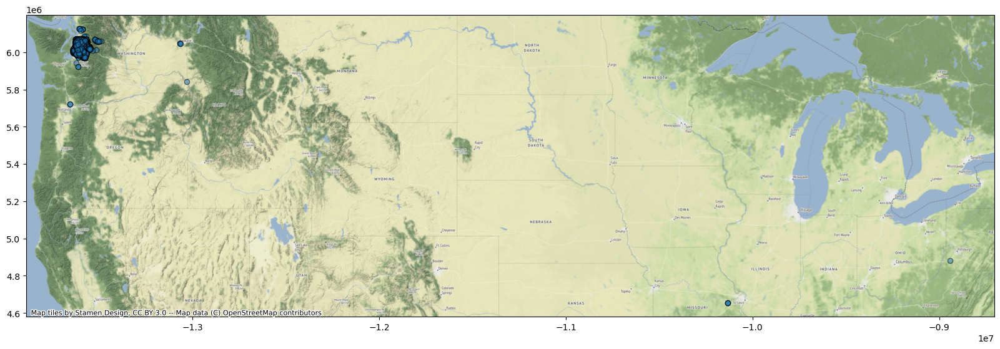

In [248]:
ax = df_wm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
cx.add_basemap(ax)

In [258]:
df_washington = df_clean[(df_clean.lat > 45) &
                              (df_clean.lat < 50) &
                              (df_clean.long > -124) &
                              (df_clean.long < -116)]

In [259]:
geometry = [Point(tuple(xy)) for xy in df_washington['loc']]
geo_df = gpd.GeoDataFrame(df_washington, crs="EPSG:4326", geometry=geometry)

In [260]:
df_wm = geo_df.to_crs(epsg=3857)

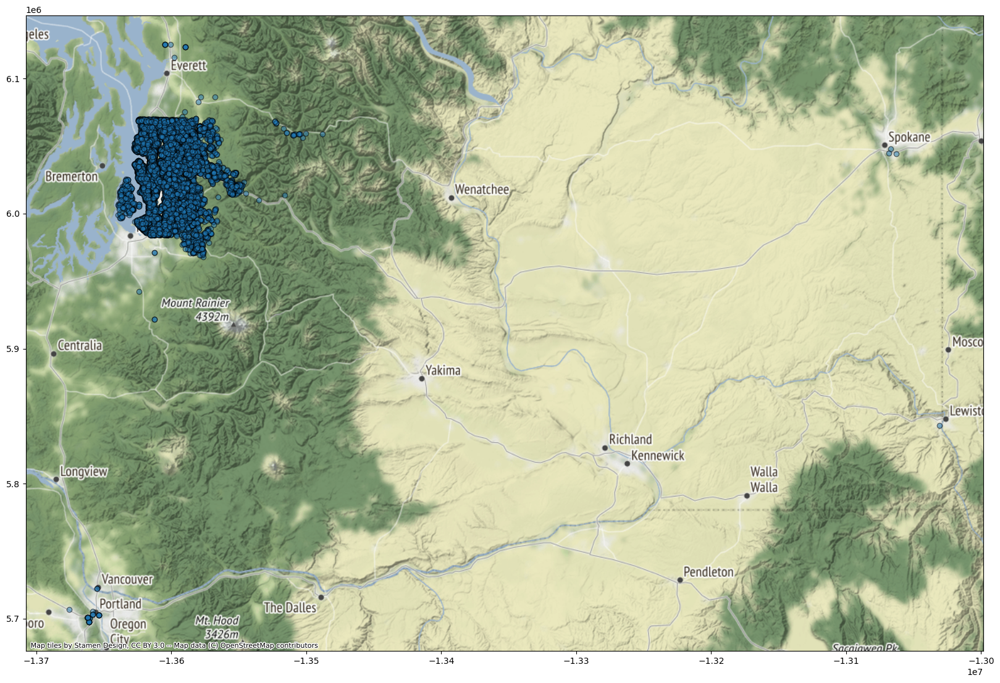

In [261]:
ax = df_wm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
cx.add_basemap(ax)

In [234]:
bad = []

for x in df_washington.address:
    if 'Missouri' in x:
        bad.append('True')
    elif 'Pennsylvania' in x:
        bad.append('True')
    else:
        bad.append('False')
df_washington['bad'] = pd.Series(bad)
df_washington = df_washington[df_washington.bad == 'False']
df_washington = df_washington.drop(['washington', 'bad'], axis=1)

In [239]:
df_washington

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,...,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long,city,loc,geometry
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,...,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052,Renton,"[-122.19052, 47.461975]",POINT (-122.19052 47.46198)
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,...,0,240,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591,Seattle,"[-122.35591, 47.711525]",POINT (-122.35591 47.71153)
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,...,0,0,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520,Seattle,"[-122.2252, 47.502045]",POINT (-122.22520 47.50205)
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,...,200,270,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020,Seattle,"[-122.2902, 47.56611]",POINT (-122.29020 47.56611)
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,...,550,30,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188,Issaquah,"[-122.07188, 47.53247]",POINT (-122.07188 47.53247)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27373,7899800832,12/22/2021,769999.0,3,2.0,1630,1502,2.0,NO,NO,...,0,330,2020,0,"9040 18th Avenue Southwest, Seattle, Washingto...",47.521660,-122.35737,Seattle,"[-122.35737, 47.52166]",POINT (-122.35737 47.52166)
27374,3522900035,2/16/2022,1185000.0,4,2.0,1980,7020,1.0,NO,NO,...,0,0,1910,0,"4502 Southwest Frontenac Street, Seattle, Wash...",47.540710,-122.39064,Seattle,"[-122.39064, 47.54071]",POINT (-122.39064 47.54071)
27375,952003464,5/4/2022,1125000.0,3,2.0,1560,4600,1.0,NO,NO,...,0,140,1946,0,"4110 38th Avenue Southwest, Seattle, Washingto...",47.566130,-122.37978,Sammamish,"[-122.37978, 47.56613]",POINT (-122.37978 47.56613)
27376,1822059126,11/17/2021,575000.0,3,1.0,1697,15520,1.5,NO,NO,...,0,282,1920,0,"9726 S 234th Pl, Kent, Washington 98031, Unite...",47.392010,-122.21069,Seattle,"[-122.21069, 47.39201]",POINT (-122.21069 47.39201)


In [236]:
geometry = [Point(tuple(xy)) for xy in df_washington['loc']]
geo_df = gpd.GeoDataFrame(df_washington, crs="EPSG:4326", geometry=geometry)

In [237]:
df_wm = geo_df.to_crs(epsg=3857)

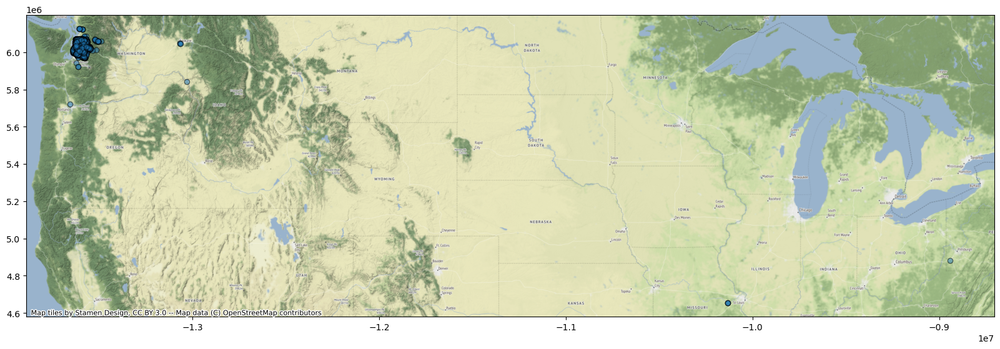

In [238]:
ax = df_wm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
cx.add_basemap(ax)

In [242]:
wash = []
for x in df_washington.address:
    if 'Washington' not in x:
        wash.append('True')
    else:
        wash.append('False')
df_washington['washington'] = pd.Series(wash)
df_washington.washington.value_counts()

False    25658
Name: washington, dtype: int64

In [262]:
df_washington = df[(df.lat > 45) &
                              (df.lat < 50) &
                              (df.long > -124) &
                              (df.long < -116)]

In [264]:
df_washington.dropna(inplace=True)

In [265]:
df_washington

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,greenbelt,...,sewer_system,sqft_above,sqft_basement,sqft_garage,sqft_patio,yr_built,yr_renovated,address,lat,long
0,7399300360,5/24/2022,675000.0,4,1.0,1180,7140,1.0,NO,NO,...,PUBLIC,1180,0,0,40,1969,0,"2102 Southeast 21st Court, Renton, Washington ...",47.461975,-122.19052
1,8910500230,12/13/2021,920000.0,5,2.5,2770,6703,1.0,NO,NO,...,PUBLIC,1570,1570,0,240,1950,0,"11231 Greenwood Avenue North, Seattle, Washing...",47.711525,-122.35591
2,1180000275,9/29/2021,311000.0,6,2.0,2880,6156,1.0,NO,NO,...,PUBLIC,1580,1580,0,0,1956,0,"8504 South 113th Street, Seattle, Washington 9...",47.502045,-122.22520
3,1604601802,12/14/2021,775000.0,3,3.0,2160,1400,2.0,NO,NO,...,PUBLIC,1090,1070,200,270,2010,0,"4079 Letitia Avenue South, Seattle, Washington...",47.566110,-122.29020
4,8562780790,8/24/2021,592500.0,2,2.0,1120,758,2.0,NO,NO,...,PUBLIC,1120,550,550,30,2012,0,"2193 Northwest Talus Drive, Issaquah, Washingt...",47.532470,-122.07188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30150,7834800180,11/30/2021,1555000.0,5,2.0,1910,4000,1.5,NO,NO,...,PUBLIC,1600,1130,0,210,1921,0,"4673 Eastern Avenue North, Seattle, Washington...",47.664740,-122.32940
30151,194000695,6/16/2021,1313000.0,3,2.0,2020,5800,2.0,NO,NO,...,PUBLIC,2020,0,0,520,2011,0,"4131 44th Avenue Southwest, Seattle, Washingto...",47.565610,-122.38851
30152,7960100080,5/27/2022,800000.0,3,2.0,1620,3600,1.0,NO,NO,...,PUBLIC,940,920,240,110,1995,0,"910 Martin Luther King Jr Way, Seattle, Washin...",47.610395,-122.29585
30153,2781280080,2/24/2022,775000.0,3,2.5,2570,2889,2.0,NO,NO,...,PUBLIC,1830,740,480,100,2006,0,"17127 114th Avenue Southeast, Renton, Washingt...",47.449490,-122.18908


In [266]:
df_split = df_washington.address.str.split(', ')

In [267]:
cities = []
numbers = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
for x in df_split:
    if x[1][0] in numbers:
        cities.append(x[2])     
    else:
        cities.append(x[1])
pd.Series(cities)
df_split

0        [2102 Southeast 21st Court, Renton, Washington...
1        [11231 Greenwood Avenue North, Seattle, Washin...
2        [8504 South 113th Street, Seattle, Washington ...
3        [4079 Letitia Avenue South, Seattle, Washingto...
4        [2193 Northwest Talus Drive, Issaquah, Washing...
                               ...                        
30150    [4673 Eastern Avenue North, Seattle, Washingto...
30151    [4131 44th Avenue Southwest, Seattle, Washingt...
30152    [910 Martin Luther King Jr Way, Seattle, Washi...
30153    [17127 114th Avenue Southeast, Renton, Washing...
30154    [18615 7th Avenue South, Burien, Washington 98...
Name: address, Length: 29230, dtype: object

In [270]:
df_washington['city'] = pd.Series(cities)

In [271]:
city_dummies = pd.get_dummies(df_washington.city)
city_dummies

,Algona,Ames Lake,Arlington,Auburn,Baring,Beaux Arts,Bellevue,Black Diamond,Bothell,Burien,...,Snoqualmie Pass,Spanaway,Spokane,Tukwila,Tulalip,Union Hill-Novelty Hill,Vancouver,Vashon,Woodinville,Yarrow Point
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30150,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30151,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30152,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30153,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [272]:
cities_df = pd.concat([df_washington.price,city_dummies], axis=1)

In [273]:
y = df_washington.price
X = sm.add_constant(city_dummies.drop('Algona', axis=1))
model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.220
Date:                Tue, 06 Dec 2022   Prob (F-statistic):              0.111
Time:                        15:50:16   Log-Likelihood:            -4.4202e+05
No. Observations:               29230   AIC:                         8.842e+05
Df Residuals:                   29165   BIC:                         8.847e+05
Df Model:                          64                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    1.063e+06    2.9e+04     36.616      0.000    1.01e+06    1.12e+06
Ames Lake                1.279e+05   8.95e+05      0.143      0.886   -1.63e+06    1.88e+06
Arlington                9.644e+05   4.48e+05      2.151      0.031    8.56e+04    1.84e+06
Auburn                   3.389e+04   3.73e+04      0.909      0.363   -3.92e+04    1.07e+05
Baring                   7.734e+05   3.66e+05      2.110      0.035    5.51e+04    1.49e+06
Beaux Arts               1.422e+05   2.71e+05      0.524      0.600    -3.9e+05    6.74e+05
Bellevue                  7.77e+04   3.74e+04      2.076      0.038    4325.028    1.51e+05
Black Diamond            8.055e+04   6.17e+04      1.305      0.192   -4.04e+04    2.02e+05
Bothell                  1.959e+04    6.3e+04      0.311      0.756   -1.04e+05    1.43e+05
Burien                   1.038e+05   4.68e+04      2.218      0.027    1.21e+04    1.96e+05
Carnation                5.953e+04   7.82e+04      0.761      0.446   -9.37e+04    2.13e+05
Clarkston               -5.631e+05   8.95e+05     -0.629      0.529   -2.32e+06    1.19e+06
Clyde Hill              -6453.2208   1.16e+05     -0.056      0.955   -2.33e+05     2.2e+05
Cottage Lake             1.237e+06   8.95e+05      1.382      0.167   -5.18e+05    2.99e+06
Covington                 3.16e+04   4.99e+04      0.633      0.527   -6.63e+04    1.29e+05
Dash Point               3.619e+05   8.95e+05      0.404      0.686   -1.39e+06    2.12e+06
Des Moines               4.219e+04   5.32e+04      0.792      0.428   -6.22e+04    1.47e+05
Dilworth                -4.831e+05   8.95e+05     -0.540      0.590   -2.24e+06    1.27e+06
Duvall                  -3806.8925   6.45e+04     -0.059      0.953    -1.3e+05    1.23e+05
Eatonville               5.745e+05   6.33e+05      0.907      0.364   -6.67e+05    1.82e+06
Enumclaw                -3.798e+04   5.14e+04     -0.738      0.460   -1.39e+05    6.29e+04
Fairwood                -1.861e+05   8.95e+05     -0.208      0.835   -1.94e+06    1.57e+06
Fall City                3936.6678   9.01e+04      0.044      0.965   -1.73e+05    1.81e+05
Federal Way              5.627e+04   3.94e+04      1.426      0.154    -2.1e+04    1.34e+05
Hobart                  -4.866e+05   4.48e+05     -1.085      0.278   -1.37e+06    3.92e+05
Hunts Point             -8.433e+04   3.39e+05     -0.248      0.804    -7.5e+05    5.81e+05
Issaquah                 1.794e+05   4.79e+04      3.749      0.000    8.56e+04    2.73e+05
Kenmore                 -2.378e+04   5.69e+04     -0.418      0.676   -1.35e+05    8.77e+04
Kent                      1.38e+04   3.69e+04      0.374      0.708   -5.85e+04    8.61e+04
Kirkland                 2.896e+04   3.86e+04      0.751      0.453   -4.66e+04    1.05e+05
Lake Forest Park         1.162e+05   6.81e+04  

In [282]:
sns.set(rc={'figure.figsize':(100, 100)})
sns.heatmap(pd.concat([df_washington.price, city_dummies], axis=1).corr(), annot=True)

<AxesSubplot:>